# Vecteurs et valeurs propres - KMAXPP05

## Configuration du notebook

In [1]:
import numpy as np
import scipy as sp
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib.patches import Polygon

In [2]:
from matplotlib import rc
rc('animation', html='jshtml')

## Fonctions

In [3]:
def animate_linear_transform(A, direction=False, vectors=False, determinent=True, sample=None, size=17):
    assert A.shape[0] == A.shape[1]
    fig, ax = plt.subplots(figsize=(8, 8))
    I = np.eye(A.shape[0])
    X1, X2 = np.meshgrid((np.linspace(-8., 8., size)), (np.linspace(-8., 8., size)))
    X = np.stack((X1.ravel(), X2.ravel())).T
    eigval, eigvec = np.linalg.eig(A)
    if np.any(np.iscomplex(eigval)):
        print("Valeurs propres complèxes !")
        direction = False
        vectors = False
    if eigval[0] > eigval[1]:
        v1, lbd1 = eigvec[:,0], eigval[0]
        v2, lbd2 = eigvec[:,1], eigval[1]
    else:
        v1, lbd1 = eigvec[:,1], eigval[1]
        v2, lbd2 = eigvec[:,0], eigval[0]
    t_vals = np.linspace(-4, 4, size)
    x = np.linspace(-4, 4, size)
    Z1 = np.outer(t_vals, v1) # Points along span of v1
    Z2 = np.outer(t_vals, v2) # Points along span of v2
    unit_square = np.array([[0., 0.], [1., 0.], [1., 1.], [0., 1.]])
    def update(frame):
        ax.clear()
        t = frame / 50
        M = (1 - t) * I + t * A
        Y = X @ M.T  # the linear transfor is generally written M @ X with a column vector, but here we have row-vectors
        Y1 = Y[:,0].reshape((size, size))
        Y2 = Y[:,1].reshape((size, size))
        for i in range(size):
            ax.plot(Y1[i, :], Y2[i, :], color="k", alpha=0.1)
            ax.plot(Y1[:, i], Y2[:, i], color="k", alpha=0.1)
        if direction:
            Z1t = Z1 @ M.T
            Z2t = Z2 @ M.T
            if np.abs(v1[0]) < 1e-8:
                ax.axvline(0., color="orange", ls=":", lw=1, label="1ère direction principale")
            else:
                ax.plot(x, v1[1] / v1[0] * x, color="orange", ls=":", lw=1, label="1ère direction principale")
            if np.abs(v2[0]) < 1e-8:
                ax.axvline(0., color="blue", ls=":", lw=1, label="2ème direction principale")
            else:
                ax.plot(x, v2[1] / v2[0] * x, color="blue", ls=":", lw=1, label="2ème direction principale")
            ax.scatter(Z1t[:,0], Z1t[:,1], color="orange", marker="+", zorder=10, s=50)
            ax.scatter(Z2t[:,0], Z2t[:,1], color="blue", marker="+", zorder=10, s=50)
        if vectors:
            ax.quiver(
                0, 0, lbd1 * v1[0], lbd1 * v1[1], 
                angles='xy', scale_units='xy', scale=1, 
                color='orange', width=0.01, zorder=5,
                alpha=0.75, label=r"$\lambda_1 u_1$"
            )
            ax.quiver(
                0, 0, lbd2 * v2[0], lbd2 * v2[1], 
                angles='xy', scale_units='xy', scale=1, 
                color='blue', width=0.01, zorder=5,
                alpha=0.75, label=r"$\lambda_2 u_2$"
            )            
        if determinent:
            current_square = unit_square @ M.T
            p = Polygon(current_square, closed=True, color='black', alpha=0.6)
            ax.add_patch(p)
        if sample is not None:
            current_sample = sample @ M.T
            ax.scatter(current_sample[:, 0], current_sample[:, 1], marker="+", color="k")
        ax.set_xlim((-4.0, 4.0))
        ax.set_ylim((-4.0, 4.0))
        ax.set_aspect("equal")
        if vectors or direction:
            ax.legend(loc="lower center")
    ani = FuncAnimation(fig, update, frames=51, interval=50, repeat=True)
    plt.close(fig)
    return ani

## Transformations linéaires dans $\mathbb{R}^2$

In [4]:
# A = np.array([[2., 1.], [0., 0.5]])
# A = np.array([[0.5, 0.], [0., 2.0]])
# A = np.array([[2.0, 0.], [0., 2.0]])
# A = np.array([[0., 1.], [-1., 0.]])
# A = np.array([[0., 1.], [0., 1.]])
# A = np.array([[1., 2.], [2., -1.]])
A = np.array([[1., 0.4], [0.4, 1.]])

In [5]:
animate_linear_transform(A)

In [6]:
animate_linear_transform(A, direction=True, determinent=False)

In [7]:
animate_linear_transform(A, direction=True, vectors=True, determinent=False)

## Axes de symétrie des données

In [8]:
np.random.seed(13)

In [9]:
mean = np.array([0., 0.])
cov = np.array([[1., 0.4], [0.4, 1.0]])

In [10]:
n = 1000
dist = sp.stats.multivariate_normal(mean, cov)
x = dist.rvs(n)
x = (x - x.mean(axis=0, keepdims=True)) / x.std(axis=0, keepdims=True, ddof=0)

In [11]:
corr = np.cov(x, rowvar=False, ddof=0)

In [12]:
valeurs_propres, vecteurs_propres = np.linalg.eig(corr)
tri = np.argsort(valeurs_propres)[-1::-1]
lbd = valeurs_propres[tri]
u = vecteurs_propres[:, tri]

In [13]:
m = 50
X,Y = np.meshgrid(np.linspace(-3., 3., m), np.linspace(-3., 3., m))

In [14]:
XY = np.stack((X.ravel(), Y.ravel())).T

In [15]:
Z = dist.pdf(XY).reshape(m, m)

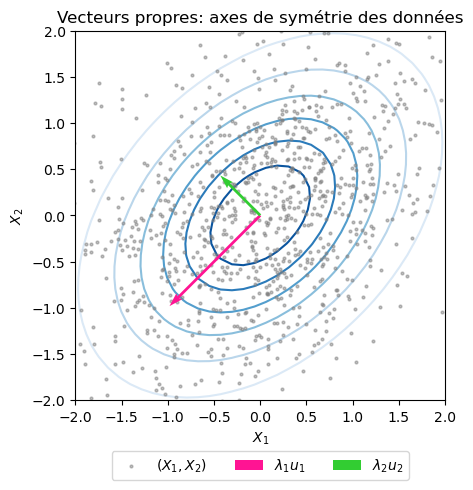

In [16]:
plt.contour(X, Y, Z, cmap="Blues");
plt.scatter(x[:,0], x[:,1], zorder=2, color="gray", s=4, alpha=0.5, label=r"$(X_1, X_2)$")
plt.quiver(0, 0, lbd[0] * u[0, 0], lbd[0] * u[1, 0], color='deeppink', angles='xy', scale_units='xy', scale=1, label=r"$\lambda_1 u_1$", zorder=3);
plt.quiver(0, 0, lbd[1] * u[0, 1], lbd[1] * u[1, 1], color='limegreen', angles='xy', scale_units='xy', scale=1, label=r"$\lambda_2 u_2$", zorder=3);
plt.gca().set_aspect('equal', adjustable='box')
plt.xlim(-2, 2)
plt.ylim(-2, 2)
plt.xlabel(r"$X_1$")
plt.ylabel(r"$X_2$")
plt.legend(loc="upper center", ncol=3, bbox_to_anchor=(0.5, -0.12))
plt.title("Vecteurs propres: axes de symétrie des données");